# **Neural Style Transfer**

### **Imports**

In [ ]:
import torch
from torchvision import io, models, transforms
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython import display
from tqdm import tqdm
import os
import glob
import imageio.v2 as imageio

### **Download and preprocess the images**

In [ ]:
# Download images
content_path = "swan.jpg"
style_path = "kandinsky.jpg"

!wget -q https://cdn.pixabay.com/photo/2017/02/28/23/00/swan-2107052_1280.jpg -O $content_path
!wget -q https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg -O $style_path

**Function to load an image and limit its maximum dimension to max_dim (512) pixels**

In [ ]:
def preprocessing(path, max_dim=512):
  img = io.read_image(path)
  img = img.to(torch.float32) / 255

  shape = torch.tensor(img.shape[1:], dtype=torch.float32)
  scale = max_dim / max(shape)
  new_shape = (shape * scale).to(torch.int32)
  img = nn.functional.interpolate(img[None, :], size=tuple(new_shape))

  return img

**Function to display and save the images**

In [ ]:
# Images directory
directory_images = "/content/images/neural_style_transfer"

directory_nst = os.path.join(directory_images, "swan_kandinsky")
os.makedirs(directory_nst, exist_ok=True)

In [ ]:
def show_and_save_images(content_image, style_image, gen_image=None,
                         epoch=0, save=False, titles=[""]*3):

  content_image = torch.squeeze(content_image).permute(1, 2, 0)
  style_image = torch.squeeze(style_image).permute(1, 2, 0)

  if gen_image is not None:
    gen_image = gen_image.detach().cpu()
    gen_image = torch.squeeze(gen_image).permute(1, 2, 0)

    if save:
      plt.imshow(gen_image)
      plt.axis("off")
      plt.savefig(os.path.join(directory_nst, f"image{epoch:02d}.png"), transparent=True)
      plt.close()

    fig, ax = plt.subplots(1, 3, figsize=(15, 4))
    ax[2].imshow(gen_image)
    ax[2].set_title(titles[2])
    ax[2].axis("off")

  else:
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

  ax[0].imshow(content_image)
  ax[0].set_title(titles[0])
  ax[0].axis("off")

  ax[1].imshow(style_image)
  ax[1].set_title(titles[1])
  ax[1].axis("off")

  plt.show()

In [ ]:
content_image = preprocessing(content_path)
style_image = preprocessing(style_path)

content_image.shape, style_image.shape

(torch.Size([1, 3, 292, 512]), torch.Size([1, 3, 336, 512]))

In [ ]:
content_image.min(), content_image.max()

(tensor(0.), tensor(1.))

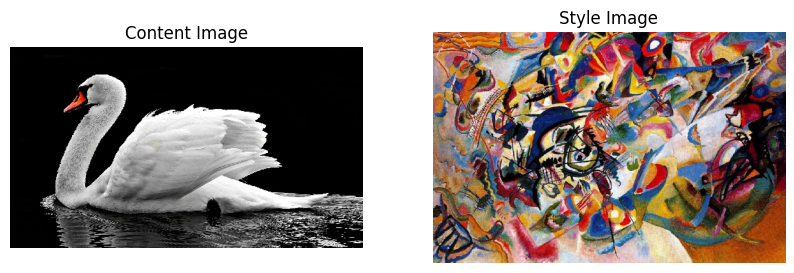

In [ ]:
show_and_save_images(content_image, style_image, titles=["Content Image", "Style Image"])

### **Build the model**

In [ ]:
device = "cuda"

In [ ]:
# Viewing the architecture of the VGG19 model
vgg = models.vgg19(weights="IMAGENET1K_V1")
print(vgg)

del vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

**Define the intermediate layers of the VGG19 model for the style and content representations of the image**

In [ ]:
style_layers = [0, 5, 10, 19, 28]
content_layers = [30]
output_layers = style_layers + content_layers

n_style_layers = len(style_layers)
n_content_layers = len(content_layers)

**Class to create the model**

In [ ]:
class VGG(nn.Module):
  def __init__(self, output_layers):
    super().__init__()

    self.model = models.vgg19(weights="IMAGENET1K_V1", progress=False).features.eval()
    self.model.requires_grad_(False)
    self.activation = nn.ReLU(inplace=False) #The activations must not be in-place to compute the Style Loss and Content Loss.
    self.output_layers = output_layers

  def forward(self, x):
    outputs = []
    for i, layer in enumerate(self.model.children()):
      x = layer(x)
      if i in self.output_layers:
        outputs.append(self.activation(x))
      if i == self.output_layers[-1]:
        break

    return outputs

In [ ]:
vgg = VGG(output_layers).to(device)

**Gram Matrix**

The style of an image is defined by the interrelationships and correlations among its different feature maps. The Gram matrix captures this information by computing the outer product of the feature vector at each location and averaging these outer products across all locations. This matrix can be efficiently computed for a specific layer using the `torch.einsum` function. The corresponding formula is:
$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$

In [ ]:
def gram_matrix(style_feature):
  gram = torch.einsum("bchw,bdhw->bcd", style_feature, style_feature)
  shape = style_feature.shape
  num_locations = torch.tensor(shape[2]*shape[3], dtype=torch.float32, device=device)
  return gram / num_locations

**Functions to get the content and style features**

In [ ]:
# The normalization_vgg function is similar to tf.keras.applications.vgg19.preprocess_input

def normalization_vgg(image):
  mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(-1, 1, 1)
  std = torch.tensor([0.229, 0.224, 0.225], device=device).view(-1, 1, 1)
  return (image - mean) / std

In [ ]:
def style_image_features(generated_style_image):
  image = normalization_vgg(generated_style_image*255)
  outputs = vgg(image)
  style_features = outputs[:n_style_layers]
  style_features = [gram_matrix(style_feature) for style_feature in style_features]
  return style_features


def content_image_features(generated_content_image):
  image = normalization_vgg(generated_content_image*255)
  outputs = vgg(image)
  content_features = outputs[n_style_layers:]
  return content_features

### **Train the model**

**Parameters**

In [ ]:
style_weight = 1e-2
content_weight = 1e-4
var_weight = 0 # Without applying total variation loss

epochs = 10
steps_per_epoch = 100

**Loss function**

In [ ]:
def style_content_loss(style_features, style_targets, content_features, content_targets,
                       style_weight=style_weight, content_weight=content_weight):

  style_loss = sum([torch.mean(torch.square(style_feature - style_target))
                   for style_feature, style_target in zip(style_features, style_targets)])
  style_loss = style_loss * style_weight / n_style_layers

  content_loss = sum([torch.mean(torch.square(content_feature - content_target))
                     for content_feature, content_target in zip(content_features, content_targets)])
  content_loss = content_loss * content_weight / n_content_layers

  total_loss = style_loss + content_loss

  return total_loss

**Total Variation Loss Function**

In [ ]:
def total_variation_loss(generated_image):
  x_delta = generated_image[:, :, :, 1:] - generated_image[:, :, :, :-1]
  y_delta = generated_image[:, :, 1:, :] - generated_image[:, :, :-1, :]
  return torch.sum(torch.abs(x_delta)) + torch.sum(torch.abs(y_delta))

**Style Transfer**

In [ ]:
def fit_style_transfer(style_image, content_image, var_weight=var_weight):
  history = {"loss":[]}
  titles = ["Content Image", "Style Image", "Generated Image"]

  style_targets = style_image_features(style_image.to(device))
  content_targets = content_image_features(content_image.to(device))
  generated_image = content_image.to(device).clone().requires_grad_(True)

  optimizer = torch.optim.Adam([generated_image], lr=0.02, betas=(0.99, 0.999), eps=1e-1)

  # Generated image from epoch 0
  show_and_save_images(content_image, style_image, generated_image,
                       save=True, titles=titles)

  for epoch in range(epochs):
    loss_list = []

    with tqdm(range(steps_per_epoch)) as pbar:
      pbar.set_description(f"[Epoch: {epoch+1}/{epochs}]")
      for step in pbar:
        optimizer.zero_grad()

        style_features = style_image_features(generated_image)
        content_features = content_image_features(generated_image)
        loss = style_content_loss(style_features, style_targets, content_features, content_targets)
        # Add the total variation loss
        loss += var_weight * total_variation_loss(generated_image)

        loss.backward()
        optimizer.step()

        with torch.no_grad():
          generated_image.clamp_(0, 1)

        loss_list.append(loss.item())
        pbar.set_postfix({"loss": loss.item()})

    loss_mean = np.mean(loss_list)
    history["loss"].append(loss_mean)

    display.clear_output(wait=True)
    print(f"Epoch {epoch+1}, Loss: {loss_mean}")

    # Examples for training
    show_and_save_images(content_image, style_image, generated_image,
                         epoch+1, save=True, titles=titles)

  return generated_image.detach().cpu(), history

Epoch 10, Loss: 194952.94625


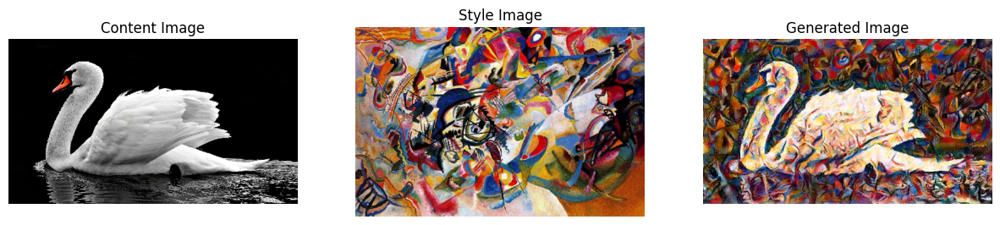

In [ ]:
gen_image, history = fit_style_transfer(style_image, content_image)

In [ ]:
gen_image.shape, gen_image.min(), gen_image.max()

(torch.Size([1, 3, 292, 512]), tensor(0.), tensor(1.))

**Function to plot the loss**

In [ ]:
def plot_metrics(history, renderer=None, epochs = epochs):
  losses = history["loss"]
  list_epochs = np.arange(1, epochs+1)

  fig=go.Figure()
  fig.add_trace(go.Scatter(x=list_epochs, y=losses, name="Loss", line=dict(color="blue", width=2)))
  fig.update_xaxes(title_text="Epoch")
  fig.update_yaxes(title_text="Loss")
  fig.update_layout(title=f"<b>Evolution of Loss across Epochs</b>",
                    title_font=dict(size=20),
                    title_x=0.5,
                    height=500,
                    width=1200)

  fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics(history)

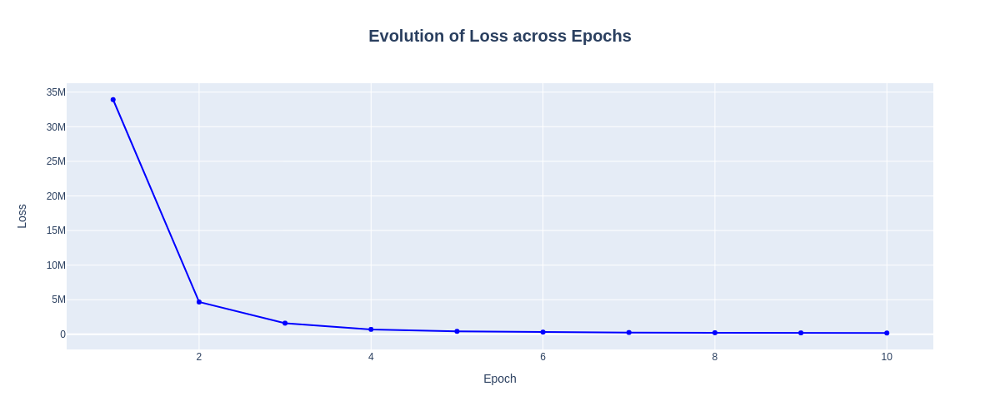

In [ ]:
# Image for GitHub
plot_metrics(history, renderer="png")

**Create a GIF from the generated images**

In [ ]:
!pip install tensorflow_docs -q

import tensorflow_docs.vis.embed as embed

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.5/182.5 kB 2.2 MB/s eta 0:00:00


In [ ]:
# Function to create gifs

def create_gif(gif_file, images_file, fps=1):
  with imageio.get_writer(gif_file, mode="I", loop=0, fps=fps) as writer:
    filenames = sorted(glob.glob(f"{images_file}/*.png"))
    for filename in filenames:
      image = imageio.imread(filename)
      writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


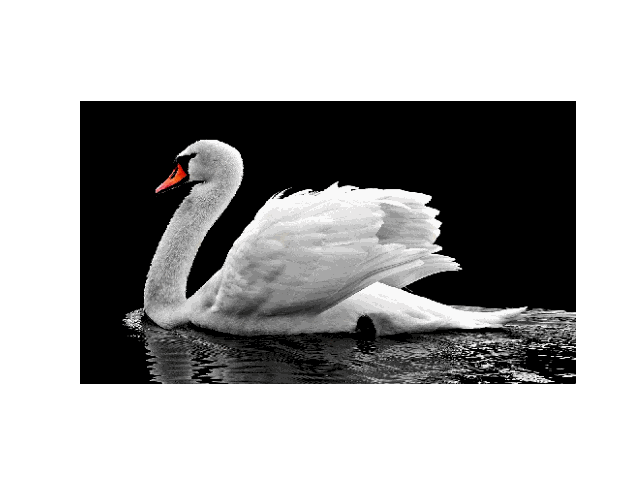

In [ ]:
gif_file = os.path.join(directory_nst, "swan_kandinsky.gif")
create_gif(gif_file, directory_nst, fps=2)
embed.embed_file(gif_file)

### **Total variation loss**

The current implementation produces high-frequency artifacts, which can be reduced by using a regularization term specific to the high-frequency components of the image, known as total variance loss. This loss has been previously implemented with the `total_variation_loss` function, which calculates the total variance of an image, promoting smoothness and reducing artifacts by penalizing differences between neighboring pixels.

**Seeing the increase in high-frequency components**

In [30]:
def get_deltas(image):
  x_delta = image[:, :, :, 1:] - image[:, :, :, :-1]
  y_delta = image[:, :, 1:, :] - image[:, :, :-1, :]

  x_delta = torch.clamp(2*x_delta + 0.5, 0, 1)
  y_delta = torch.clamp(2*y_delta + 0.5, 0, 1)

  return x_delta, y_delta

In [32]:
content_x_deltas, content_y_deltas = get_deltas(content_image)
gen_x_deltas, gen_y_deltas = get_deltas(gen_image)

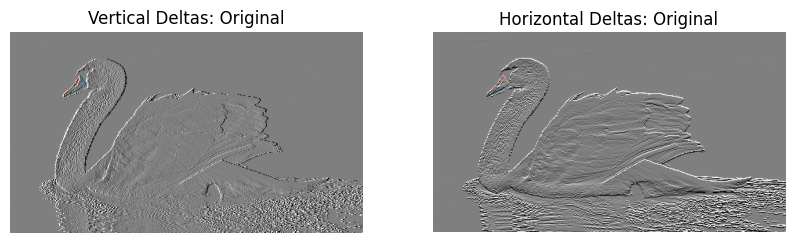

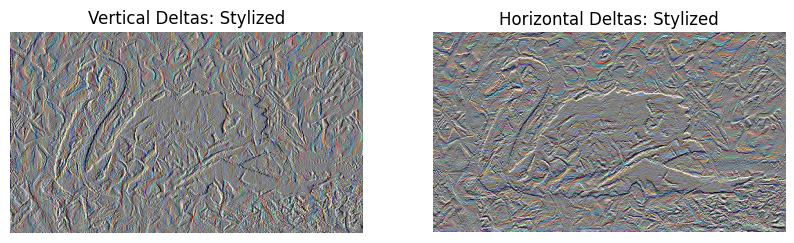

In [33]:
titles = ["Vertical Deltas: Original", "Horizontal Deltas: Original"]
show_and_save_images(content_x_deltas, content_y_deltas, titles=titles)

titles = ["Vertical Deltas: Stylized", "Horizontal Deltas: Stylized"]
show_and_save_images(gen_x_deltas, gen_y_deltas, titles=titles)

**Applying regularization**

In [46]:
vgg = VGG(output_layers).to(device)

Epoch 10, Loss: 1403988.33875


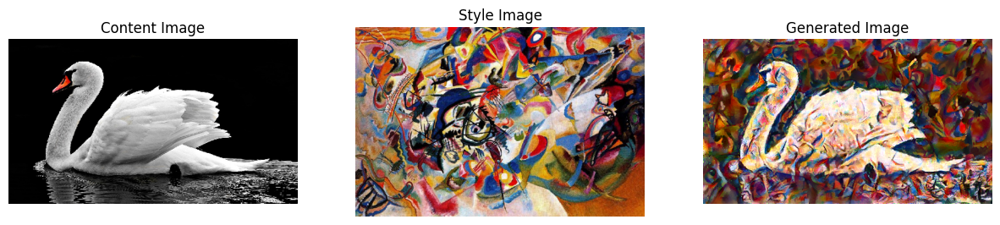

In [47]:
var_weight = 25
gen_image_reg, history = fit_style_transfer(style_image, content_image, var_weight=var_weight)

In [48]:
# Interactive graphic
plot_metrics(history)

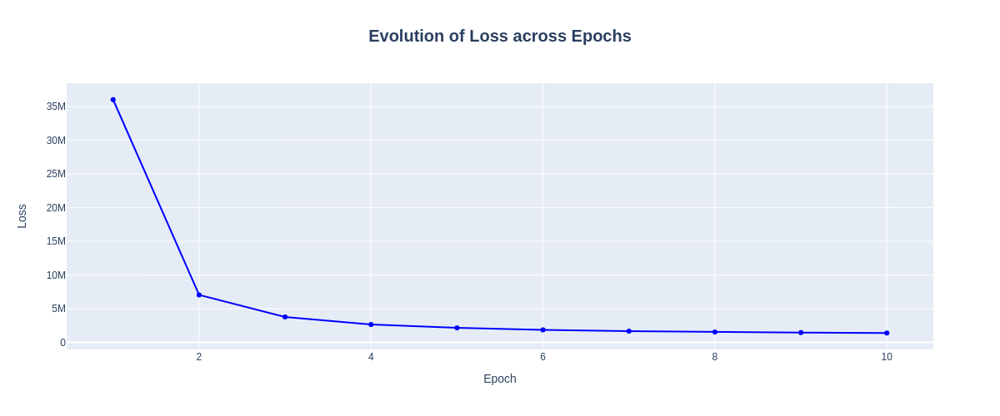

In [49]:
# Image for GitHub
plot_metrics(history, renderer="png")


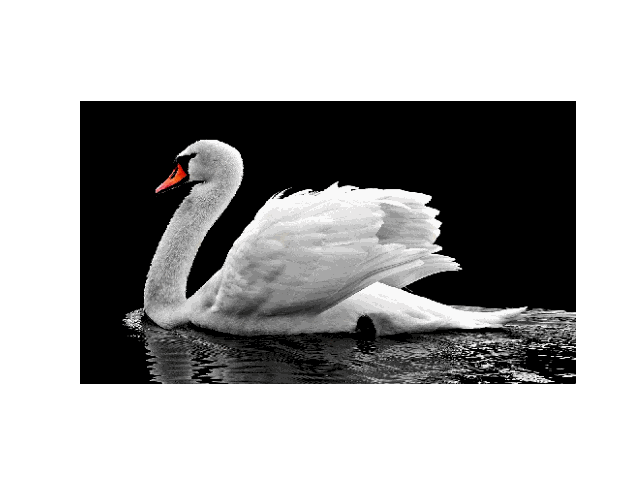

In [50]:
# create the GIF
gif_file = os.path.join(directory_nst, "swan_kandinsky.gif")
create_gif(gif_file, directory_nst, fps=2)
embed.embed_file(gif_file)

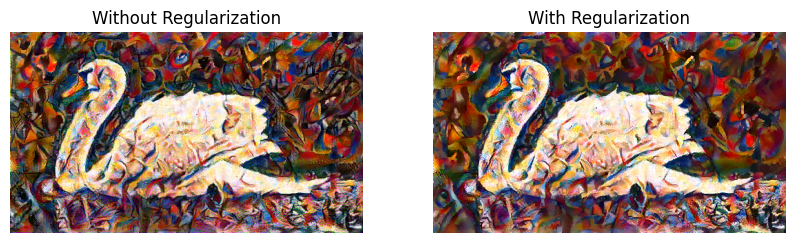

In [51]:
# Comparing
titles = ["Without Regularization", "With Regularization"]
show_and_save_images(gen_image, gen_image_reg, titles=titles)

---

### **Testing with more images**

**The Persistence of Memory <-- The Starry Night**

In [52]:
directory_nst = os.path.join(directory_images, "persistence_memory_starry_night")
os.makedirs(directory_nst, exist_ok=True)

In [53]:
content_path = "persistence_memory.jpg"
style_path = "starry_night.jpg"

!wget -q https://e00-expansion.uecdn.es/assets/multimedia/imagenes/2022/03/16/16474305262593.jpg -O $content_path
!wget -q https://e00-expansion.uecdn.es/assets/multimedia/imagenes/2022/03/16/16474297505881.jpg -O $style_path

In [54]:
content_image = preprocessing(content_path)
style_image = preprocessing(style_path)

content_image.shape, style_image.shape

(torch.Size([1, 3, 341, 511]), torch.Size([1, 3, 341, 511]))

Epoch 10, Loss: 986474.080625


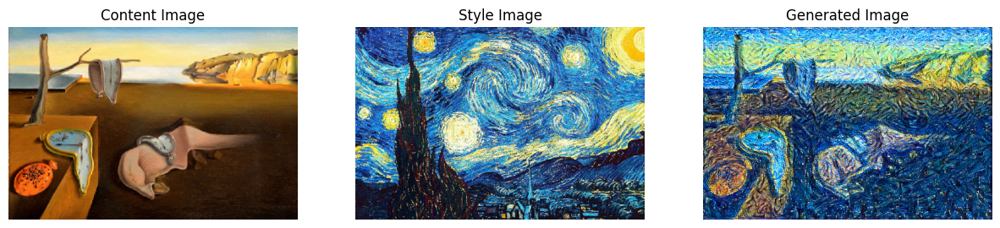

In [56]:
vgg = VGG(output_layers).to(device)
var_weight = 5
gen_image, _ = fit_style_transfer(style_image, content_image, var_weight=var_weight)


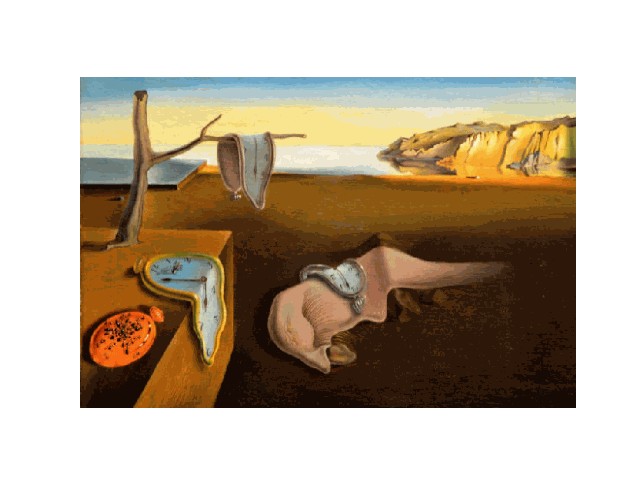

In [57]:
gif_file = os.path.join(directory_nst, "persistence_memory_starry_night.gif")
create_gif(gif_file, directory_nst, fps=2)
embed.embed_file(gif_file)

---

**Mona Lisa <-- Cubism**

In [58]:
directory_nst = os.path.join(directory_images, "mona_lisa_cubism")
os.makedirs(directory_nst, exist_ok=True)

In [59]:
content_path = "mona_lisa.jpg"
style_path = "cubism.jpg"

!wget -q https://mott.pe/noticias/wp-content/uploads/2018/01/Conoce-la-historia-de-%E2%80%9Cla-Mona-lisa%E2%80%9D-pintura-de-Leonardo-da-Vinci-destacada.jpg -O $content_path
!wget -q https://www.singulart.com/blog/wp-content/uploads/2023/11/Juan-Gris-cubism-1140x760.jpg -O $style_path

In [60]:
content_image = preprocessing(content_path)
style_image = preprocessing(style_path)

content_image.shape, style_image.shape

(torch.Size([1, 3, 341, 512]), torch.Size([1, 3, 341, 512]))

Epoch 10, Loss: 603872.11125


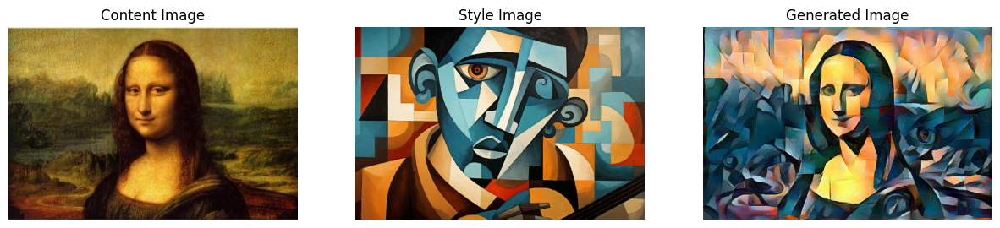

In [61]:
vgg = VGG(output_layers).to(device)
var_weight = 5
gen_image, _ = fit_style_transfer(style_image, content_image, var_weight=var_weight)


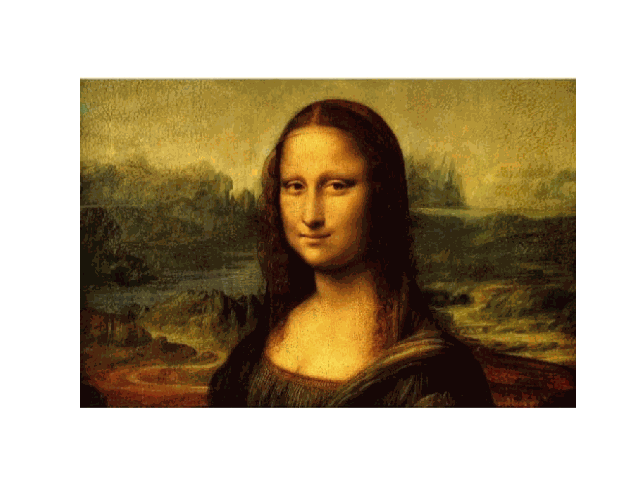

In [62]:
gif_file = os.path.join(directory_nst, "mona_lisa_cubism.gif")
create_gif(gif_file, directory_nst, fps=2)
embed.embed_file(gif_file)